# CS 636 Assignment 2: Local Feature Matching
## by Derek Jones


Note: This assignment was developed using Python 3.6. Import numpy to perform operations on matrices, skimage for image processing utilities, and matplotlib for visualizations. 

In [29]:
import numpy as np
import skimage as sk
import matplotlib.pyplot as plt

from skimage.io import imread,imsave
from skimage.color import rgb2gray
from skimage.feature import (plot_matches, CENSURE, BRIEF, 
                             match_descriptors, blob_log, corner_harris,
                             corner_shi_tomasi,corner_peaks)

Next define helper functions for some of the tasks that will be repeated. The visualization code by Kyle Helfrich was used to visualize the ground truth matches (thanks!). A function was defined to read an image, given a string identifier, and convert the image to floating point to prevent strange behavior during matrix operations.

In [30]:
def visualize_matches(image1, image2, XYXY):

    # Separating columns of the matching points
    X1 = XYXY[:,0]
    Y1 = XYXY[:,1]
    X2 = XYXY[:,2]
    Y2 = XYXY[:,3]

    # Getting image dimensions
    Height = max(image1.shape[0], image2.shape[0])
    Width = image1.shape[1] + image2.shape[1]
    numColors = image1.shape[2]

    
    # Creating image to visualize matches
    newImg = np.ones((Height, Width, numColors))
    newImg[0:image1.shape[0], 0:image1.shape[1],:] = image1
    newImg[0:image2.shape[0], 0+image1.shape[1]:, :] = image2
    
    # Displaying points and connecting lines
    shiftX = image1.shape[1]
    plt.imshow(newImg)
    plt.plot(X1, Y1,'r*')
    plt.plot(X2 + shiftX, Y2,'r*')
    for i in range(0,X1.shape[0]):
        plt.plot((X1[i],X2[i] + shiftX),(Y1[i],Y2[i]))
    return

def get_ground_truth(dataname):
    datanum = -1
    if dataname == "notre_dame":
        datanum = 1
    elif dataname == "episcopal_gaudi":
        datanum = 2
    elif dataname == "mount_rushmore":
        datanum = 3
    path = "data/dataset_"+str(datanum)+"_"+dataname+"/matches.csv"
    gt_matches = np.loadtxt(path)
    return gt_matches

def read_image(image_name,image_num):
    datanum = -1
    if image_name == "notre_dame":
        datanum = 1
    elif image_name == "episcopal_gaudi":
        datanum = 2
    elif image_name == "mount_rushmore":
        datanum = 3
    image_path = 'data/dataset_'+str(datanum)+'_'+image_name+'/image_'+str(image_num)+'.jpg'
    image = sk.img_as_float(imread(image_path))
    return image

#create parameters for window size to allow larger plots in the notebook
width = 12
height = 12

# create a parameter for number of matches to display
num_matches = 148


# Load  Images

## Read the images

In [31]:
img1 = read_image("notre_dame",1)
img2 = read_image("notre_dame",2)

img3 = read_image("episcopal_gaudi",1)
img4 = read_image("episcopal_gaudi",2)

img5 = read_image("mount_rushmore",1)
img6 = read_image("mount_rushmore",2)

### Notre Dame

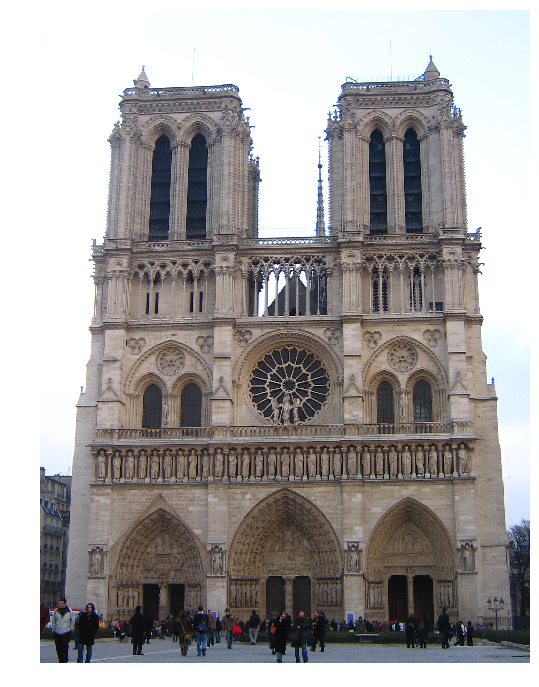

In [32]:
plt.figure(figsize=(width, height))
plt.axis('off')
plt.imshow(img1)
plt.show()

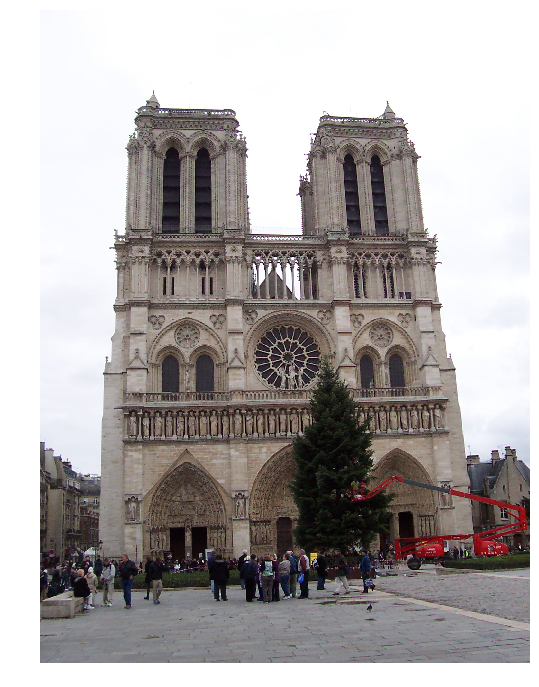

In [33]:
plt.figure(figsize=(width, height))
plt.axis('off')
plt.imshow(img2)
plt.show()

### Episcopal Gaudi

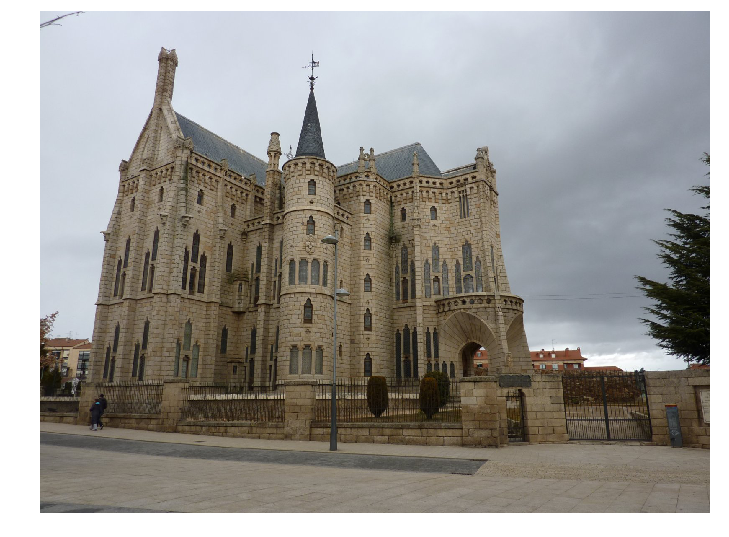

In [34]:
plt.figure(figsize=(width, height))
plt.axis('off')
plt.imshow(img3)
plt.show()

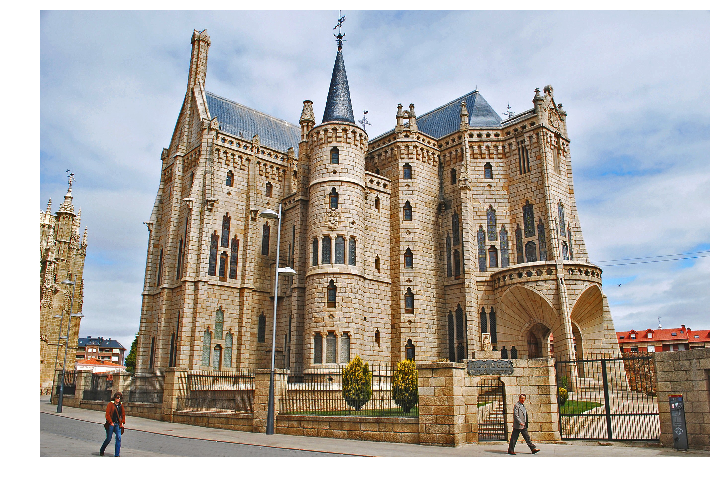

In [35]:
plt.figure(figsize=(width, height))
plt.axis('off')
plt.imshow(img4)
plt.show()

### Mount Rushmore

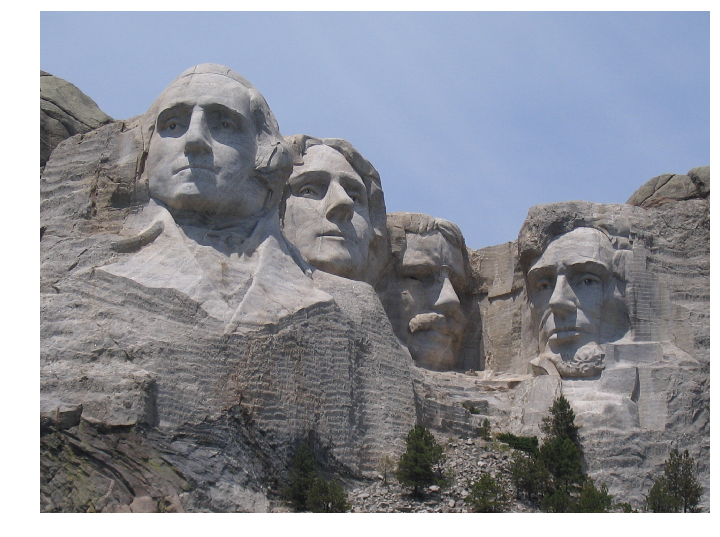

In [36]:
plt.figure(figsize=(width, height))
plt.axis('off')
plt.imshow(img5)
plt.show()

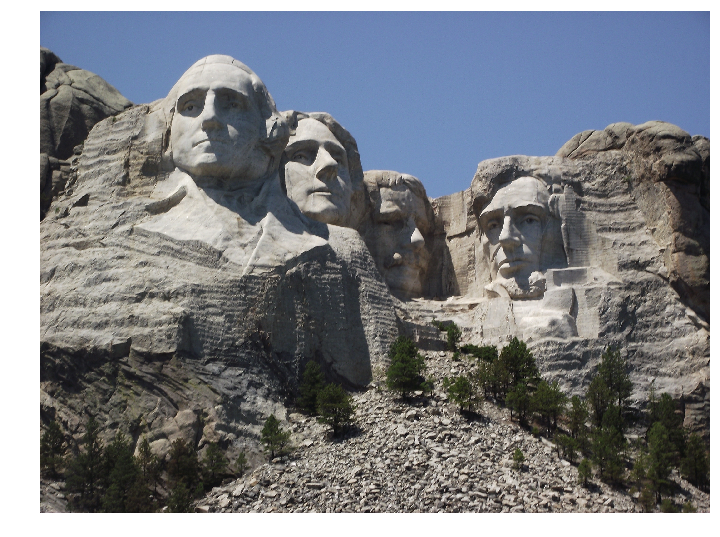

In [37]:
plt.figure(figsize=(width, height))
plt.axis('off')
plt.imshow(img6)
plt.show()

## Visualize ground truth matches

### Notre Dame

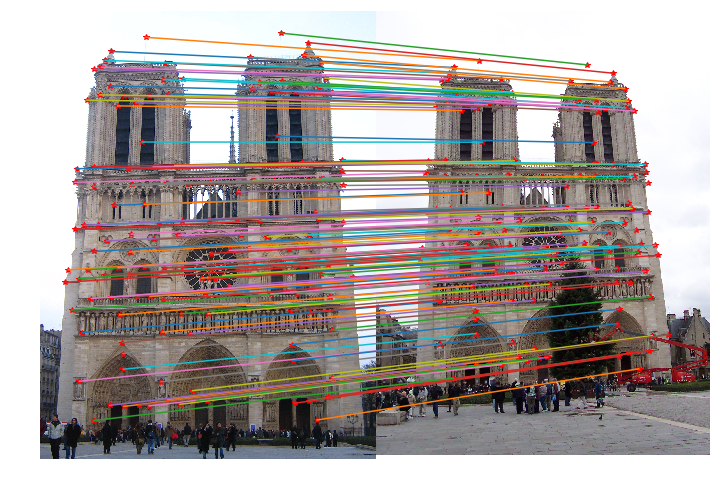

In [38]:
notre_dame_ground_truth = get_ground_truth("notre_dame")

plt.figure(figsize=(width, height))
plt.axis('off')

visualize_matches(img1,img2,notre_dame_ground_truth)
plt.savefig('data/dataset_1_notre_dame/notre_dame_groundtruth_matches.jpg')
plt.show()

### Episcopal Gaudi

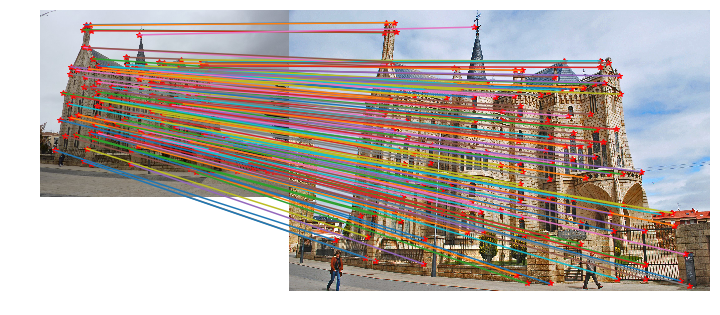

In [39]:
episcopal_gaudi_ground_truth = get_ground_truth("episcopal_gaudi")

plt.figure(figsize=(width, height))
plt.axis('off')

visualize_matches(img3,img4,episcopal_gaudi_ground_truth)
plt.savefig('data/dataset_2_episcopal_gaudi/episcopal_gaudi_groundtruth_matches.jpg')
plt.show()

### Mount Rushmore 

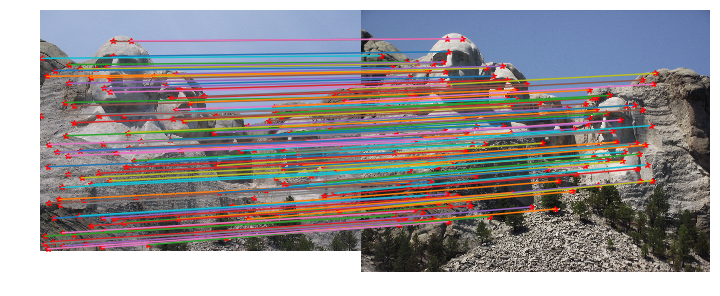

In [40]:
mount_rushmore_ground_truth = get_ground_truth("mount_rushmore")

plt.figure(figsize=(width, height))
plt.axis('off')

visualize_matches(img5,img6,mount_rushmore_ground_truth)
plt.savefig('data/dataset_3_mount_rushmore/mount_rushmore_groundtruth_matches.jpg')
plt.show()

# Keypoint Detection

Various functions are defined to compute keypoints for a given image. The functions wrap another skimage function and assume that the image is in 3-channel RGB format. 

## CENSURE

In [41]:
def get_CENSURE_kp(img):
    img = rgb2gray(img)

    censure = CENSURE(mode="star")

    censure.detect(img)

    kp = censure.keypoints
    
    return kp

## Blob LoG

In [42]:
def get_blob_log_kp(img):

    img_gray = rgb2gray(img)
    
    blob_log_kp = blob_log(img_gray,overlap=0.1, log_scale = True) 
    
    blob_log_kp = blob_log_kp[:,0:2]
    
    return blob_log_kp

## Shi-Tomasi

In [43]:
def get_shi_tomasi_keypoints(img):
    img_gray = rgb2gray(img)
    shi_tomas_kp = corner_peaks(corner_shi_tomasi(img_gray), min_distance = 1)
    
    return shi_tomas_kp

## Feature Extraction
Due to lack of availability of SIFT and SURF feature desciptor generating functions in both scikit-image and openCV, BRIEF (Binary Robust Independent Elementary Features) descriptors were used for each keypoint identification method.

A function is defined that takes as input an image and a set of keypoints. This allows flexibility in the method used to generate the keypoints in order to visualize the differences each method produces from another, while holding the type of descriptor constant.

In [44]:
def get_brief_feats(img,kp):
    img_gray = rgb2gray(img)
    brief = BRIEF()
    brief.extract(img_gray,kp)
    descriptors = brief.descriptors
    
    return descriptors

# Feature Matching
using each set of detected keypoints, including an ensemble of the results from the various keypoint generating methods, and BRIEF descriptors of the keypoints, keypoint correspondences between each pair of images are given. 

## BRIEF-CENSURE

### Notre Dame

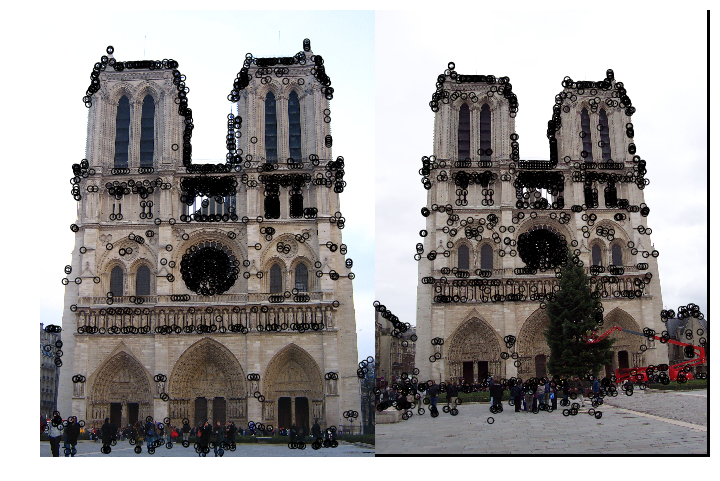

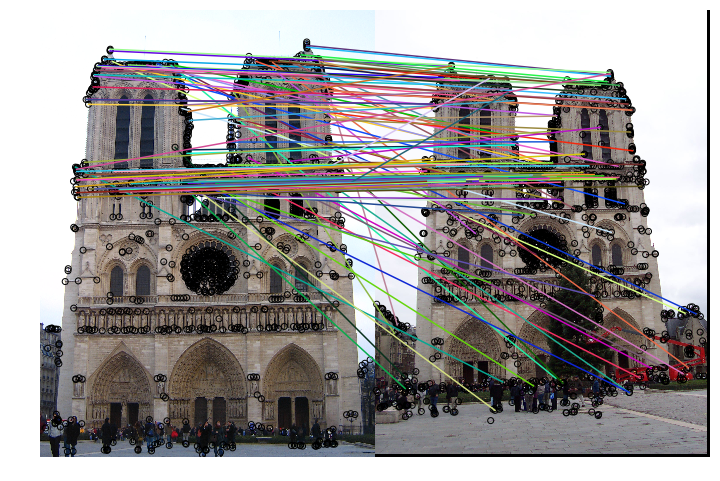

In [45]:
img1_censure_kp = get_CENSURE_kp(img1)
img2_censure_kp = get_CENSURE_kp(img2)

img1_censure_feats = get_brief_feats(img1,img1_censure_kp)
img2_censure_feats = get_brief_feats(img2,img2_censure_kp)

censure_matches_notre_dame = match_descriptors(img1_censure_feats,img2_censure_feats)

img1_censure_kp_output = img1_censure_kp[censure_matches_notre_dame[:,0],:]
img2_censure_kp_output = img2_censure_kp[censure_matches_notre_dame[:,1],:]

notre_dame_censure_brief_estimation = np.append(img1_censure_kp_output,img2_censure_kp_output,axis = 1)

np.savetxt("data/dataset_1_notre_dame/notre_dame_CENSURE_BRIEF_estimation.csv",notre_dame_censure_brief_estimation,delimiter=',')


plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img1,img2,img1_censure_kp,img2_censure_kp,censure_matches_notre_dame[:0])
plt.savefig("data/dataset_1_notre_dame/notre_dame_censure_keypoints.jpg")

plt.show()




plt.figure(figsize=(width, height))
plt.gray()
plt.axis("off")
plot_matches(plt,img1,img2,img1_censure_kp,img2_censure_kp,censure_matches_notre_dame[:num_matches])
plt.savefig("data/dataset_1_notre_dame/notre_dame_CENSURE_BRIEF_estimation.jpg")

plt.show()

### Episcopal Gaudi

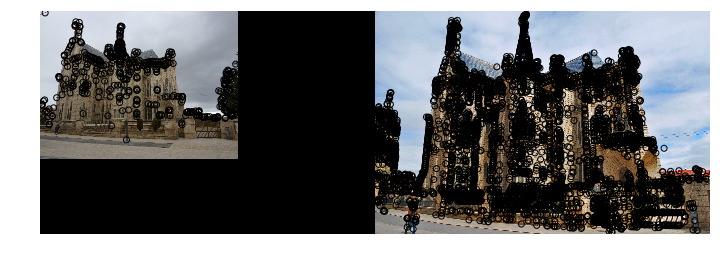

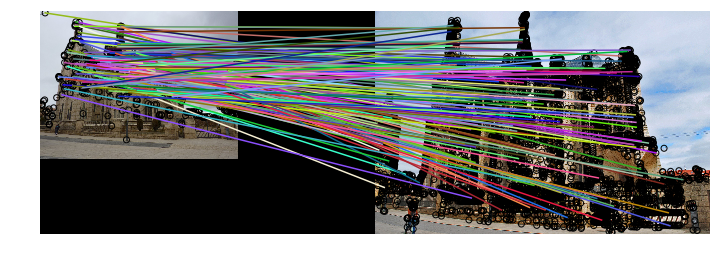

In [46]:
img3_censure_kp = get_CENSURE_kp(img3)
img4_censure_kp = get_CENSURE_kp(img4)

img3_censure_feats = get_brief_feats(img3,img3_censure_kp)
img4_censure_feats = get_brief_feats(img4,img4_censure_kp)

censure_matches_episcopal_gaudi = match_descriptors(img3_censure_feats,img4_censure_feats)

img3_censure_kp_output = img3_censure_kp[censure_matches_episcopal_gaudi[:,0],:]
img4_censure_kp_output = img4_censure_kp[censure_matches_episcopal_gaudi[:,1],:]

episcopal_gaudi_censure_brief_estimation = np.append(img3_censure_kp_output,img4_censure_kp_output,axis = 1)

np.savetxt("data/dataset_2_episcopal_gaudi/episcopal_gaudi_CENSURE_BRIEF_estimation.csv",episcopal_gaudi_censure_brief_estimation,delimiter=',')

plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img3,img4,img3_censure_kp,img4_censure_kp,censure_matches_episcopal_gaudi[:0])
plt.savefig("data/dataset_2_episcopal_gaudi/episcopal_gaudi_censure_keypoints.jpg")

plt.show()



plt.figure(figsize=(width, height))
plt.gray()
plt.axis("off")
plot_matches(plt,img3,img4,img3_censure_kp,img4_censure_kp,censure_matches_episcopal_gaudi[:num_matches])
plt.savefig("data/dataset_2_episcopal_gaudi/episcopal_gaudi_CENSURE_BRIEF_estimation.jpg")

plt.show()

### Mount Rushmore

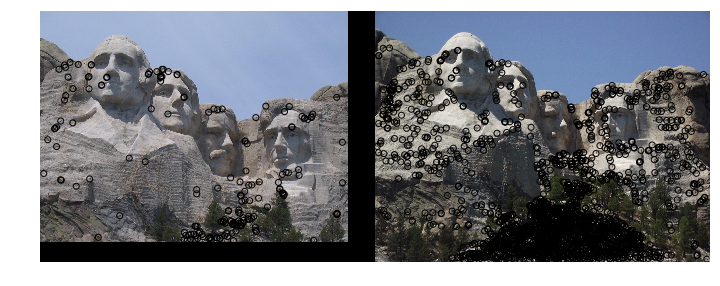

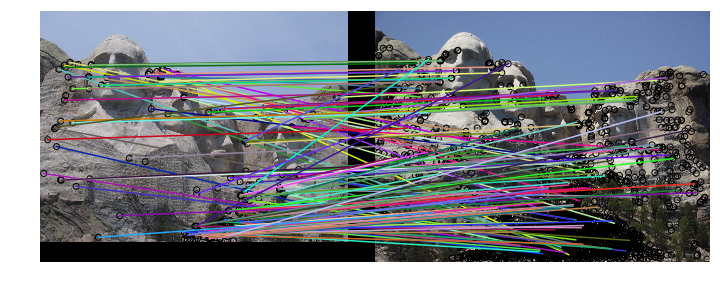

In [47]:
img5_censure_kp = get_CENSURE_kp(img5)
img6_censure_kp = get_CENSURE_kp(img6)

img5_censure_feats = get_brief_feats(img5,img5_censure_kp)
img6_censure_feats = get_brief_feats(img6,img6_censure_kp)

censure_matches_mount_rushmore = match_descriptors(img5_censure_feats,img6_censure_feats)

img5_censure_kp_output = img5_censure_kp[censure_matches_mount_rushmore[:,0],:]
img6_censure_kp_output = img6_censure_kp[censure_matches_mount_rushmore[:,1],:]

mount_rushmore_censure_brief_estimation = np.append(img5_censure_kp_output,img6_censure_kp_output,axis = 1)

np.savetxt("data/dataset_3_mount_rushmore/mount_rushmore_CENSURE_BRIEF_estimation.csv",mount_rushmore_censure_brief_estimation,delimiter=',')

plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img5,img6,img5_censure_kp,img6_censure_kp,censure_matches_mount_rushmore[:0])
plt.savefig("data/dataset_3_mount_rushmore/mount_rushmore_censure_keypoints.jpg")

plt.show()


plt.figure(figsize=(width, height))
plt.axis("off")
plt.gray()
plot_matches(plt,img5,img6,img5_censure_kp,img6_censure_kp,censure_matches_mount_rushmore[:num_matches])
plt.savefig("data/dataset_3_mount_rushmore/mount_rushmore_CENSURE_BRIEF_estimation.jpg")
plt.show()

## BRIEF-BLOB

### Notre Dame

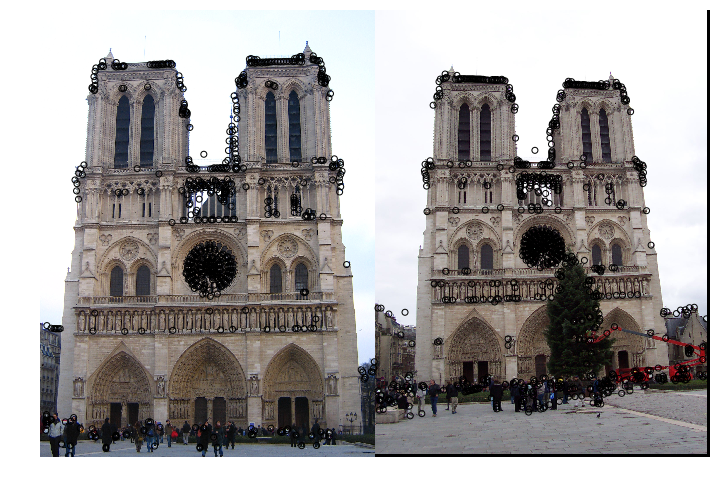

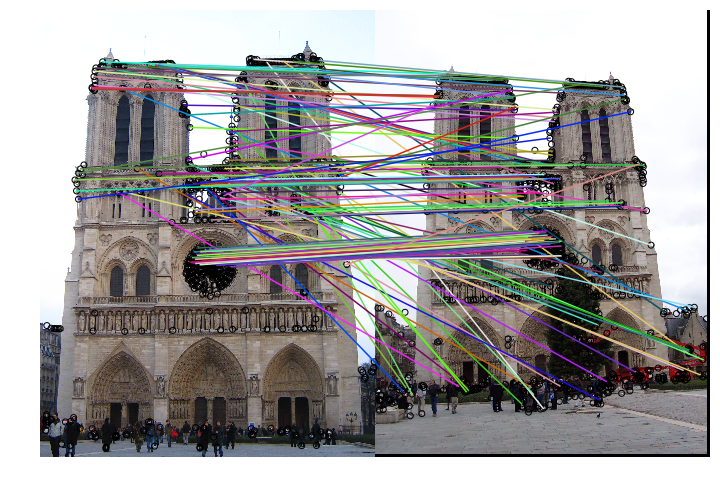

In [48]:
img1_blob_kp = get_blob_log_kp(img1)
img2_blob_kp = get_blob_log_kp(img2)

img1_blob_feats = get_brief_feats(img1,img1_blob_kp)
img2_blob_feats = get_brief_feats(img2,img2_blob_kp)


blob_matches_notre_dame = match_descriptors(img1_blob_feats,img2_blob_feats)

img1_blob_kp_output = img1_blob_kp[blob_matches_notre_dame[:,0],:]
img2_blob_kp_output = img2_blob_kp[blob_matches_notre_dame[:,1],:]

notre_dame_blob_brief_estimation = np.append(img1_blob_kp_output,img2_blob_kp_output,axis = 1)

np.savetxt("data/dataset_1_notre_dame/notre_dame_blob_BRIEF_estimation.csv",notre_dame_blob_brief_estimation,delimiter=',')

plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img1,img2,img1_blob_kp,img2_blob_kp,blob_matches_notre_dame[:0])
plt.savefig("data/dataset_1_notre_dame/notre_dame_blob_keypoints.jpg")

plt.show()


plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img1,img2,img1_blob_kp,img2_blob_kp,blob_matches_notre_dame[:num_matches])
plt.savefig("data/dataset_1_notre_dame/notre_dame_blob_BRIEF_estimation.jpg")

plt.show()

### Epsicopal Gaudi

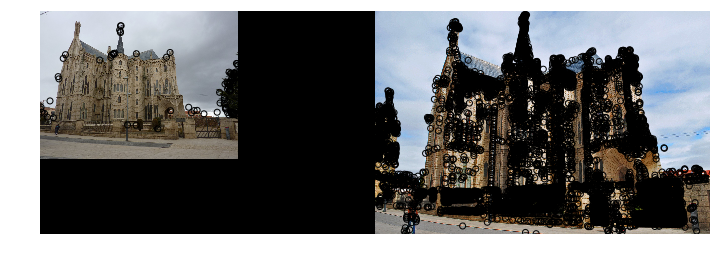

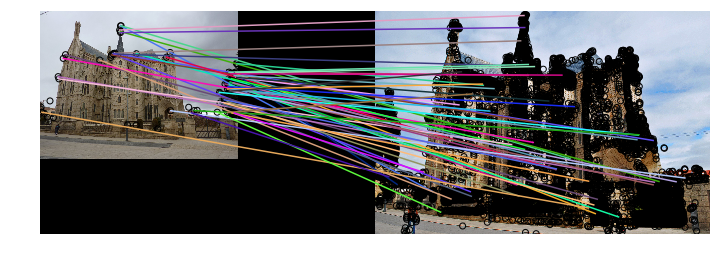

In [49]:
img3_blob_kp = get_blob_log_kp(img3)
img4_blob_kp = get_blob_log_kp(img4)


img3_blob_feats = get_brief_feats(img3,img3_blob_kp)
img4_blob_feats = get_brief_feats(img4,img4_blob_kp)

blob_matches_episcopal_gaudi = match_descriptors(img3_blob_feats,img4_blob_feats)

img3_blob_kp_output = img3_blob_kp[blob_matches_episcopal_gaudi[:,0],:]
img4_blob_kp_output = img4_blob_kp[blob_matches_episcopal_gaudi[:,1],:]

episcopal_gaudi_blob_brief_estimation = np.append(img3_blob_kp_output,img4_blob_kp_output,axis = 1)

np.savetxt("data/dataset_2_episcopal_gaudi/episcopal_gaudi_blob_BRIEF_estimation.csv",episcopal_gaudi_blob_brief_estimation,delimiter=',')

plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img3,img4,img3_blob_kp,img4_blob_kp,blob_matches_episcopal_gaudi[:0])
plt.savefig("data/dataset_2_episcopal_gaudi/episcopal_gaudi_blob_keypoints.jpg")

plt.show()



plt.figure(figsize=(width, height))
plt.axis("off")
plt.gray()
plot_matches(plt,img3,img4,img3_blob_kp,img4_blob_kp,blob_matches_episcopal_gaudi[:num_matches])
plt.savefig("data/dataset_2_episcopal_gaudi/episcopal_gaudi_blob_BRIEF_estimation.jpg")
plt.show()

### Mount Rushmore

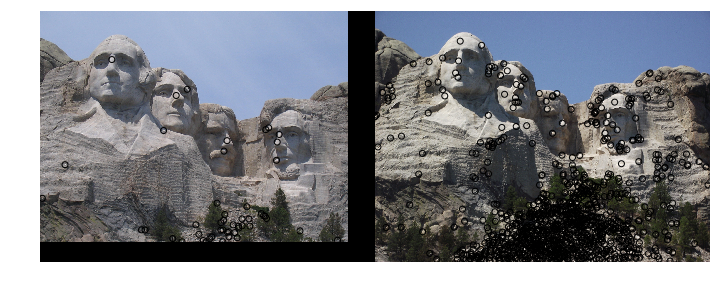

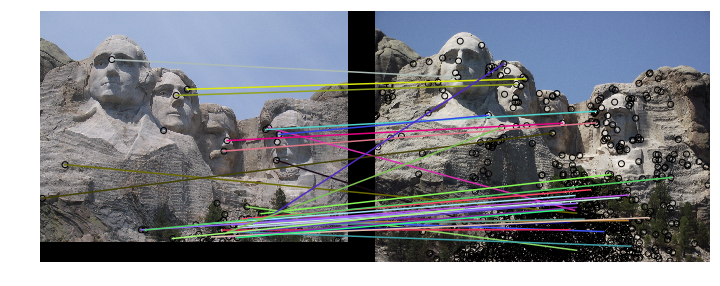

In [50]:
img5_blob_kp = get_blob_log_kp(img5)
img6_blob_kp = get_blob_log_kp(img6)


img5_blob_feats = get_brief_feats(img5,img5_blob_kp)
img6_blob_feats = get_brief_feats(img6,img6_blob_kp)

blob_matches_mount_rushmore = match_descriptors(img5_blob_feats,img6_blob_feats)

img5_blob_kp_output = img5_blob_kp[blob_matches_mount_rushmore[:,0],:]
img6_blob_kp_output = img6_blob_kp[blob_matches_mount_rushmore[:,1],:]

mount_rushmore_blob_brief_estimation = np.append(img5_blob_kp_output,img6_blob_kp_output,axis = 1)

np.savetxt("data/dataset_3_mount_rushmore/mount_rushmore_blob_BRIEF_estimation.csv",mount_rushmore_blob_brief_estimation,delimiter=',')


plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img5,img6,img5_blob_kp,img6_blob_kp,blob_matches_mount_rushmore[:0])
plt.savefig("data/dataset_3_mount_rushmore/mount_rushmore_blob_keypoints.jpg")

plt.show()

plt.figure(figsize=(width, height))
plt.axis("off")
plt.gray()
plot_matches(plt,img5,img6,img5_blob_kp,img6_blob_kp,blob_matches_mount_rushmore[:num_matches])
plt.savefig("data/dataset_3_mount_rushmore/mount_rushmore_blob_BRIEF_estimation.jpg")

plt.show()

## BRIEF - Shi-Tomas

### Notre Dame

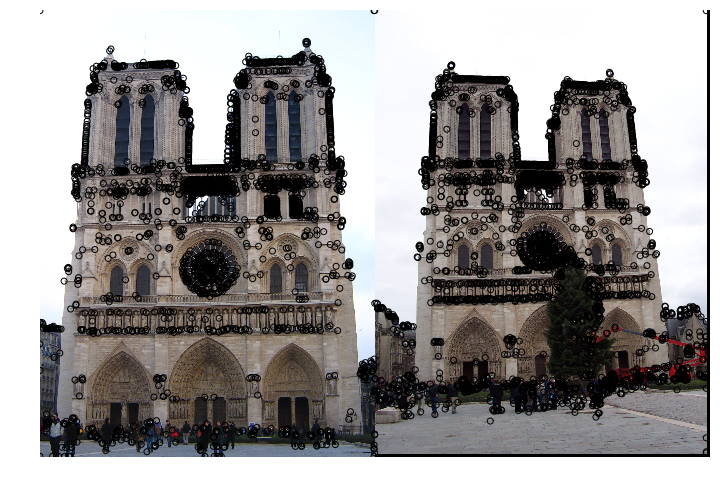

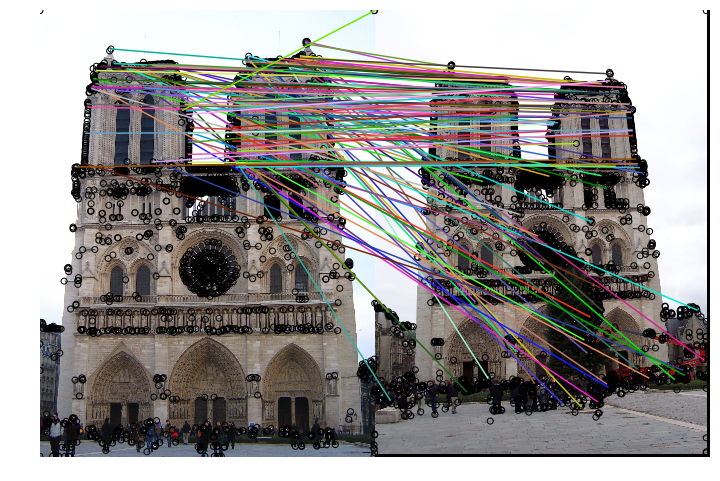

In [51]:
img1_shi_tomas_kp = get_shi_tomasi_keypoints(img1)
img2_shi_tomas_kp = get_shi_tomasi_keypoints(img2)

img1_shi_tomas_feats = get_brief_feats(img1,img1_shi_tomas_kp)
img2_shi_tomas_feats = get_brief_feats(img2,img2_shi_tomas_kp)

shi_tomas_matches_notre_dame = match_descriptors(img1_shi_tomas_feats,img2_shi_tomas_feats)

img1_shi_tomas_kp_output = img1_shi_tomas_kp[shi_tomas_matches_notre_dame[:,0],:]
img2_shi_tomas_kp_output = img2_shi_tomas_kp[shi_tomas_matches_notre_dame[:,1],:]

notre_dame_shi_tomas_brief_estimation = np.append(img1_shi_tomas_kp_output,img2_shi_tomas_kp_output,axis = 1)

np.savetxt("data/dataset_1_notre_dame/notre_dame_shi_tomas_BRIEF_estimation.csv",notre_dame_shi_tomas_brief_estimation,delimiter=',')


plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img1,img2,img1_shi_tomas_kp,img2_shi_tomas_kp,shi_tomas_matches_notre_dame[:0])
plt.savefig("data/dataset_1_notre_dame/notre_dame_shi_tomas_keypoints.jpg")

plt.show()



plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img1,img2,img1_shi_tomas_kp,img2_shi_tomas_kp,shi_tomas_matches_notre_dame[:num_matches])
plt.savefig("data/dataset_1_notre_dame/notre_dame_shi_tomas_BRIEF_estimation.jpg")

plt.show()

### Episcopal Gaudi

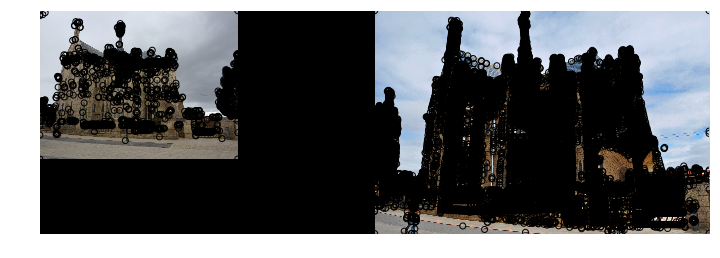

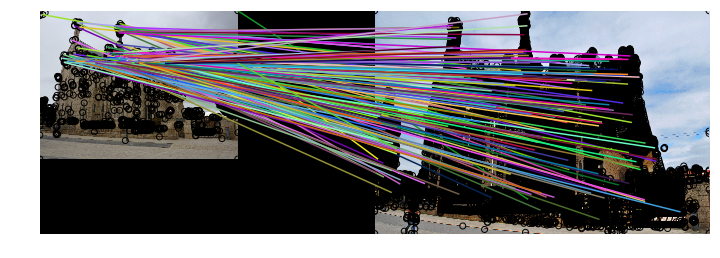

In [52]:
img3_shi_tomas_kp = get_shi_tomasi_keypoints(img3)
img4_shi_tomas_kp = get_shi_tomasi_keypoints(img4)

img3_shi_tomas_feats = get_brief_feats(img3,img3_shi_tomas_kp)
img4_shi_tomas_feats = get_brief_feats(img4,img4_shi_tomas_kp)

shi_tomas_matches_episcopal_gaudi = match_descriptors(img3_shi_tomas_feats,img4_shi_tomas_feats)

img3_shi_tomas_kp_output = img3_shi_tomas_kp[shi_tomas_matches_episcopal_gaudi[:,0],:]
img4_shi_tomas_kp_output = img4_shi_tomas_kp[shi_tomas_matches_episcopal_gaudi[:,1],:]

episcopal_gaudi_shi_tomas_brief_estimation = np.append(img3_shi_tomas_kp_output,img4_shi_tomas_kp_output,axis = 1)

np.savetxt("data/dataset_2_episcopal_gaudi/episcopal_gaudi_shi_tomas_BRIEF_estimation.csv",episcopal_gaudi_shi_tomas_brief_estimation,delimiter=',')


plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img3,img4,img3_shi_tomas_kp,img4_shi_tomas_kp,shi_tomas_matches_episcopal_gaudi[:0])
plt.savefig("data/dataset_2_episcopal_gaudi/episcopal_gaudi_shi_tomas_keypoints.jpg")

plt.show()



plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img3,img4,img3_shi_tomas_kp,img4_shi_tomas_kp,shi_tomas_matches_episcopal_gaudi[:num_matches])
plt.savefig("data/dataset_2_episcopal_gaudi/episcopal_gaudi_shi_tomas_BRIEF_estimation.jpg")
plt.show()

### Mount Rushmore

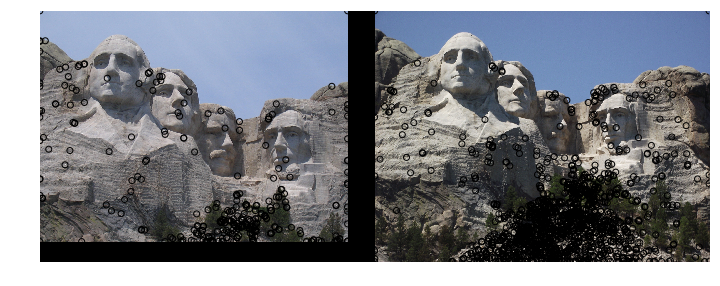

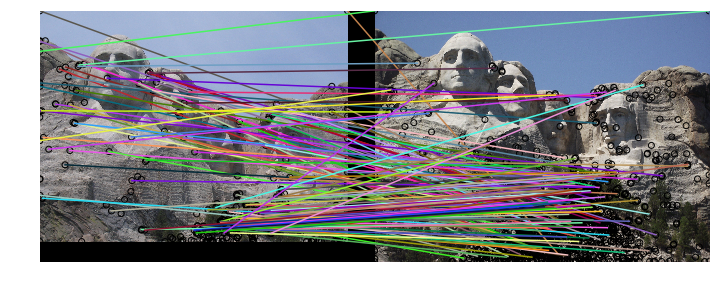

In [53]:
img5_shi_tomas_kp = get_shi_tomasi_keypoints(img5)
img6_shi_tomas_kp = get_shi_tomasi_keypoints(img6)

img5_shi_tomas_feats = get_brief_feats(img5,img5_shi_tomas_kp)
img6_shi_tomas_feats = get_brief_feats(img6,img6_shi_tomas_kp)

shi_tomas_matches_mount_rushmore = match_descriptors(img5_shi_tomas_feats,img6_shi_tomas_feats)

img5_shi_tomas_kp_output = img5_shi_tomas_kp[shi_tomas_matches_mount_rushmore[:,0],:]
img6_shi_tomas_kp_output = img6_shi_tomas_kp[shi_tomas_matches_mount_rushmore[:,1],:]

mount_rushmore_shi_tomas_brief_estimation = np.append(img5_shi_tomas_kp_output,img6_shi_tomas_kp_output,axis = 1)

np.savetxt("data/dataset_3_mount_rushmore/mount_rushmore_shi_tomas_BRIEF_estimation.csv",mount_rushmore_shi_tomas_brief_estimation,delimiter=',')

plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img5,img6,img5_shi_tomas_kp,img6_shi_tomas_kp,shi_tomas_matches_mount_rushmore[:0])
plt.savefig("data/dataset_3_mount_rushmore/mount_rushmore_shi_tomas_keypoints.jpg")

plt.show()


plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img5,img6,img5_shi_tomas_kp,img6_shi_tomas_kp,shi_tomas_matches_mount_rushmore[:num_matches])
plt.savefig("data/dataset_3_mount_rushmore/mount_rushmore_shitomasi_BRIEF_estimation.jpg")
plt.show()

## BRIEF - ENSEMBLE

### Notre Dame

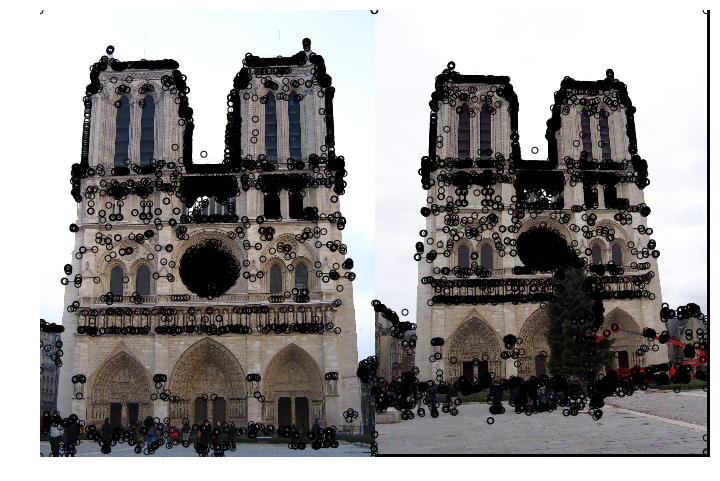

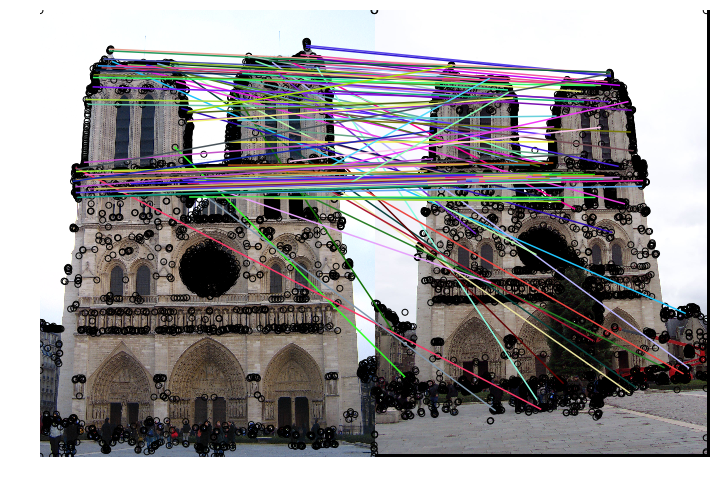

In [54]:
img1_ensemble_feats = np.append(img1_censure_feats,img1_blob_feats, axis = 0)
img1_ensemble_feats = np.append(img1_ensemble_feats,img1_shi_tomas_feats,axis=0)


img1_ensemble_kp = np.append(img1_censure_kp,img1_blob_kp,axis = 0)
img1_ensemble_kp = np.append(img1_ensemble_kp, img1_shi_tomas_kp,axis=0)

img2_ensemble_feats = np.append(img2_censure_feats,img2_blob_feats, axis = 0)
img2_ensemble_feats = np.append(img2_ensemble_feats,img2_shi_tomas_feats,axis=0)


img2_ensemble_kp = np.append(img2_censure_kp,img2_blob_kp,axis = 0)
img2_ensemble_kp = np.append(img2_ensemble_kp, img2_shi_tomas_kp,axis=0)

notre_dame_ensemble_matches = match_descriptors(img1_ensemble_feats,img2_ensemble_feats,metric = "hamming",cross_check=True)


img1_ensemble_kp_output = img1_ensemble_kp[notre_dame_ensemble_matches[:,0],:]
img2_ensemble_kp_output = img2_ensemble_kp[notre_dame_ensemble_matches[:,1],:]

notre_dame_ensemble_brief_estimation = np.append(img1_ensemble_kp_output,img2_ensemble_kp_output,axis = 1)

np.savetxt("data/dataset_1_notre_dame/notre_dame_ensemble_BRIEF_estimation.csv",notre_dame_ensemble_brief_estimation,delimiter=',')


plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img1,img2,img1_ensemble_kp,img2_ensemble_kp,notre_dame_ensemble_matches[:0])
plt.savefig("data/dataset_1_notre_dame/notre_dame_ensemble_keypoints.jpg")

plt.show()




plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img1,img2,img1_ensemble_kp,img2_ensemble_kp,notre_dame_ensemble_matches[:num_matches])
plt.savefig("data/dataset_1_notre_dame/notre_dame_ensemble_estimation.jpg")

plt.show()



### Episcopal Gaudi

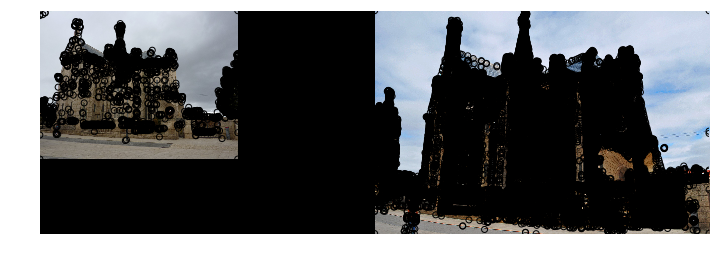

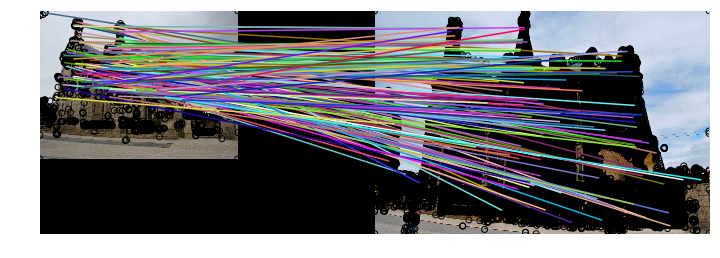

In [55]:
img3_ensemble_feats = np.append(img3_censure_feats,img3_blob_feats, axis = 0)
img3_ensemble_feats = np.append(img3_ensemble_feats,img3_shi_tomas_feats,axis=0)


img3_ensemble_kp = np.append(img3_censure_kp,img3_blob_kp,axis = 0)
img3_ensemble_kp = np.append(img3_ensemble_kp, img3_shi_tomas_kp,axis=0)

img4_ensemble_feats = np.append(img4_censure_feats,img4_blob_feats, axis = 0)
img4_ensemble_feats = np.append(img4_ensemble_feats,img4_shi_tomas_feats,axis=0)


img4_ensemble_kp = np.append(img4_censure_kp,img4_blob_kp,axis = 0)
img4_ensemble_kp = np.append(img4_ensemble_kp, img4_shi_tomas_kp,axis=0)

episcopal_gaudi_ensemble_matches = match_descriptors(img3_ensemble_feats,img4_ensemble_feats,metric = "hamming",cross_check=True)


img3_ensemble_kp_output = img3_ensemble_kp[episcopal_gaudi_ensemble_matches[:,0],:]
img4_ensemble_kp_output = img4_ensemble_kp[episcopal_gaudi_ensemble_matches[:,1],:]

episcopal_gaudi_ensemble_brief_estimation = np.append(img3_ensemble_kp_output,img4_ensemble_kp_output,axis = 1)

np.savetxt("data/dataset_2_episcopal_gaudi/episcopal_gaudi_ensemble_BRIEF_estimation.csv",episcopal_gaudi_ensemble_brief_estimation,delimiter=',')


plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img3,img4,img3_ensemble_kp,img4_ensemble_kp,episcopal_gaudi_ensemble_matches[:0])
plt.savefig("data/dataset_2_episcopal_gaudi/episcopal_gaudi_ensemble_keypoints.jpg")

plt.show()



plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img3,img4,img3_ensemble_kp,img4_ensemble_kp,episcopal_gaudi_ensemble_matches[:num_matches])
plt.savefig("data/dataset_2_episcopal_gaudi/episcopal_gaudi_ensemble_estimation.jpg")

plt.show()

### Mount Rushmore

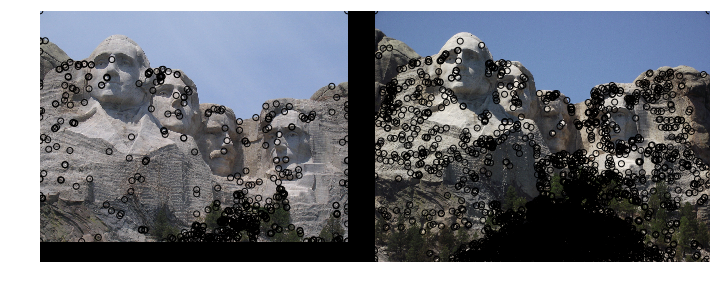

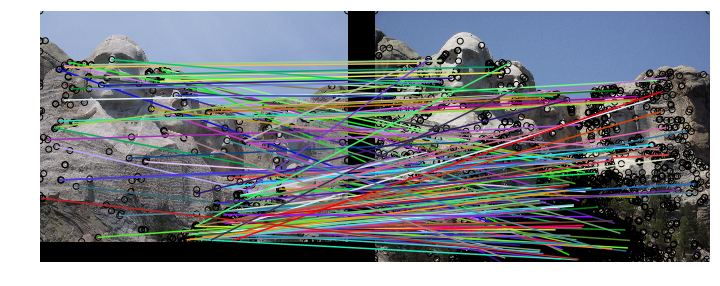

In [56]:
img5_ensemble_feats = np.append(img5_censure_feats,img5_blob_feats, axis = 0)
img5_ensemble_feats = np.append(img5_ensemble_feats,img5_shi_tomas_feats,axis=0)


img5_ensemble_kp = np.append(img5_censure_kp,img5_blob_kp,axis = 0)
img5_ensemble_kp = np.append(img5_ensemble_kp, img5_shi_tomas_kp,axis=0)

img6_ensemble_feats = np.append(img6_censure_feats,img6_blob_feats, axis = 0)
img6_ensemble_feats = np.append(img6_ensemble_feats,img6_shi_tomas_feats,axis=0)


img6_ensemble_kp = np.append(img6_censure_kp,img6_blob_kp,axis = 0)
img6_ensemble_kp = np.append(img6_ensemble_kp, img6_shi_tomas_kp,axis=0)

mount_rushmore_ensemble_matches = match_descriptors(img5_ensemble_feats,img6_ensemble_feats,metric = "hamming",cross_check=True)

img5_ensemble_kp_output = img5_ensemble_kp[mount_rushmore_ensemble_matches[:,0],:]
img6_ensemble_kp_output = img6_ensemble_kp[mount_rushmore_ensemble_matches[:,1],:]

mount_rushmore_ensemble_brief_estimation = np.append(img5_ensemble_kp_output,img6_ensemble_kp_output,axis = 1)

np.savetxt("data/dataset_3_mount_rushmore/mount_rushmore_ensemble_BRIEF_estimation.csv",mount_rushmore_ensemble_brief_estimation,delimiter=',')


plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img5,img6,img5_ensemble_kp,img6_ensemble_kp,mount_rushmore_ensemble_matches[:0])
plt.savefig("data/dataset_3_mount_rushmore/mount_rushmore_ensemble_keypoints.jpg")

plt.show()

plt.figure(figsize=(width,height))
plt.axis("off")
plt.gray()
plot_matches(plt,img5,img6,img5_ensemble_kp,img6_ensemble_kp,mount_rushmore_ensemble_matches[:num_matches])
plt.savefig("data/dataset_3_mount_rushmore/mount_rushmore_ensemble_estimation.jpg")
plt.show()

## Discussion of Results

The methods that appeared to achieve the best results were the blob_log and CENSURE methods. The scikit-image feature descriptor method, blob_log, finds locations (blobs) on a given image that differ in light or color from local neighboring pixels via a Laplacian of Gaussian filter. Detecting blobs allows the algorithm to find interest points that may not be edges, but are still significant features. In the Notre Dame blob_log output versus the output of other methods, it can be observed that the dark region near the center of the image is mostly ignored by the other methods but deemed to be very significant to the blob detector. However, the blob_log dectector performs relatively poor in the detection of edges. In contrast, the CENSURE keypoint detection method appears to perfrom well at the detection of corners and edge features but ignores the dark blob area that blob_log is able to identify as significant.

## Remarks

A future improvement could be the implementation of a function that filters through a given set of matches and removes possible bad matches. In all of the generated outputs, a portion of the matches estimated for images a and b seem to reach from one extreme of a to another in image b. However, a large number of correspondences seem to be accurate in certain cases. The assumption could be that by taking keypoint candidates from a variety of methods and computing BRIEF descriptors for each, a larger number of quality match candidates will be appear in the generated output.

OpenCV was the first library to be used over the course of the assignment. Due to sparse documentation resulting in slower development, scikit-image was decided upon for the final implementation.

Tuning the parameter for maximum allowed distance for the matches could potentially improve the resulting output.

Lastly, an additional driver function for the assignment could reduce the length of the script.